# IMPORTING LIBRARIES

In [19]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

# LOADING THE DATASET.

In [3]:
data= pd.read_csv('Walmart DataSet.csv')

In [4]:
data

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,05-02-2010,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,12-02-2010,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,19-02-2010,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,26-02-2010,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,05-03-2010,1554806.68,0,46.50,2.625,211.350143,8.106
...,...,...,...,...,...,...,...,...
6430,45,28-09-2012,713173.95,0,64.88,3.997,192.013558,8.684
6431,45,05-10-2012,733455.07,0,64.89,3.985,192.170412,8.667
6432,45,12-10-2012,734464.36,0,54.47,4.000,192.327265,8.667
6433,45,19-10-2012,718125.53,0,56.47,3.969,192.330854,8.667


# EXPLORING THE DATASET.

In [5]:
data.shape

(6435, 8)

In [6]:
#Checking for null values
data.isnull().sum()

Store           0
Date            0
Weekly_Sales    0
Holiday_Flag    0
Temperature     0
Fuel_Price      0
CPI             0
Unemployment    0
dtype: int64

In [7]:
#Checking for duplicates
data.duplicated().sum()

0

In [8]:
#Describing the data.
data.describe().astype(int)

,Store,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
count,6435,6435,6435,6435,6435,6435,6435
mean,23,1046964,0,60,3,171,7
std,12,564366,0,18,0,39,1
min,1,209986,0,-2,2,126,3
25%,12,553350,0,47,2,131,6
50%,23,960746,0,62,3,182,7
75%,34,1420158,0,74,3,212,8
max,45,3818686,1,100,4,227,14


In [9]:
#Information about the data.
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Store         6435 non-null   int64  
 1   Date          6435 non-null   object 
 2   Weekly_Sales  6435 non-null   float64
 3   Holiday_Flag  6435 non-null   int64  
 4   Temperature   6435 non-null   float64
 5   Fuel_Price    6435 non-null   float64
 6   CPI           6435 non-null   float64
 7   Unemployment  6435 non-null   float64
dtypes: float64(5), int64(2), object(1)
memory usage: 402.3+ KB


In [10]:
#number of stores
data['Store'].nunique()

45

In [11]:
# number of weeks for which data is present.
data['Date'].nunique()

143

In [12]:
 #number of months for which the data is present
data['Date'].apply(lambda x :x.split('-')[1]+'-'+x.split('-')[2]).nunique()

33

#CHECKING DISTRIBUTION FOR VARIOUS NUMERICAL COLUMNS.

In [13]:
a= data.drop(columns=['Store','Date'])

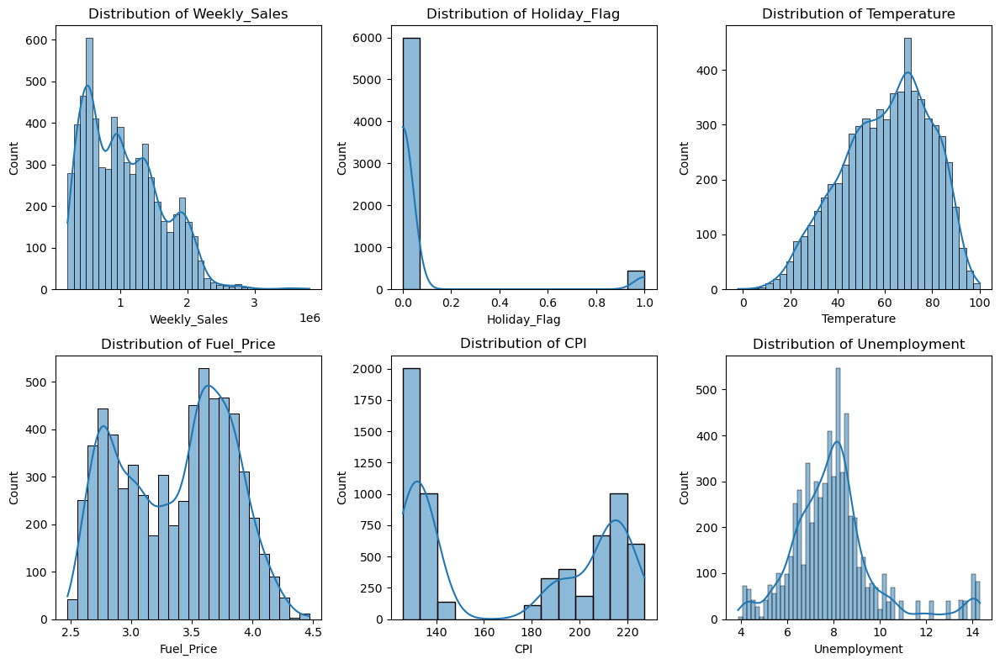

In [14]:
fig, axes = plt.subplots(2, 3, figsize=(12, 8))
for i, ax in enumerate(axes.flatten()):
    if i < len(a.columns):
        sns.histplot(data=a, x=a.columns[i],kde= True, ax=ax)
        ax.set_title(f'Distribution of {a.columns[i]}')


plt.tight_layout()

plt.show()

### CORRELATION OF VARIOUS NUMRICAL COLUMNS AMONG EACH OTHERS.

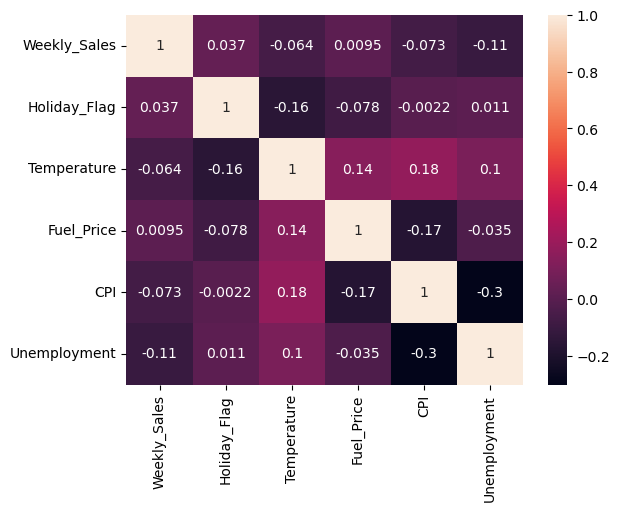

In [15]:
df1=data.drop(columns=['Store','Date'])
sns.heatmap(df1.corr(),annot=True)
plt.show()

### TOTAL SALES PER STORE.

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


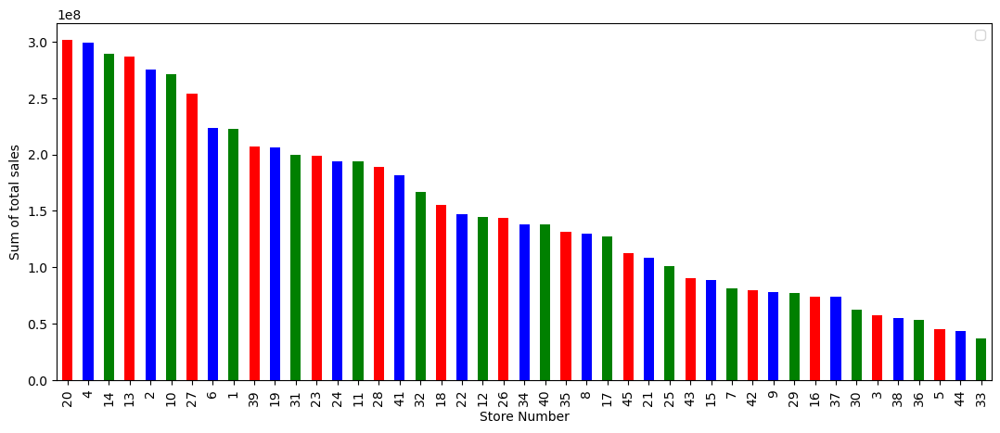

In [20]:

sum= pd.DataFrame(data.groupby('Store')['Weekly_Sales'].sum()).reset_index()
sum=sum.sort_values('Weekly_Sales', ascending= False)

plt.rcParams['figure.figsize'] = (13,5)
sum.plot.bar(x='Store', y='Weekly_Sales', color=['red','blue','green'], label='')
plt.xlabel('Store Number')
plt.ylabel('Sum of total sales')
plt.legend(loc='best')
plt.show()


In [17]:
#DIFFERENCE BETWEEN OVERALL MAXIMUM AND MINIMUM SALES.
(data[data['Store']==20]['Weekly_Sales'].sum())-(data[data['Store']==33]['Weekly_Sales'].sum())

264237570.50000006

In [21]:
# AVERAGE SALES PER STORE , YEAR WISE.

data['Year']=pd.to_datetime(data['Date']).dt.year
data.head()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,Year
0,1,05-02-2010,1643690.90,0,42.31,2.572,211.096358,8.106,2010
1,1,12-02-2010,1641957.44,1,38.51,2.548,211.242170,8.106,2010
2,1,19-02-2010,1611968.17,0,39.93,2.514,211.289143,8.106,2010
3,1,26-02-2010,1409727.59,0,46.63,2.561,211.319643,8.106,2010
4,1,05-03-2010,1554806.68,0,46.50,2.625,211.350143,8.106,2010


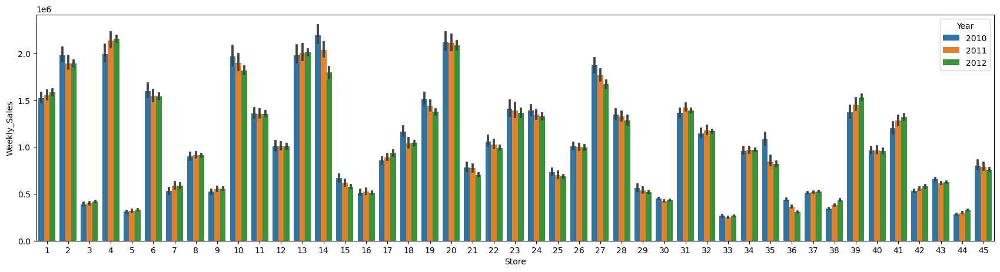

In [22]:
#year wise average sales of each store.

plt.rcParams['figure.figsize'] = (21,5)
sns.barplot(x='Store',y='Weekly_Sales',hue='Year', data=data)
plt.show()

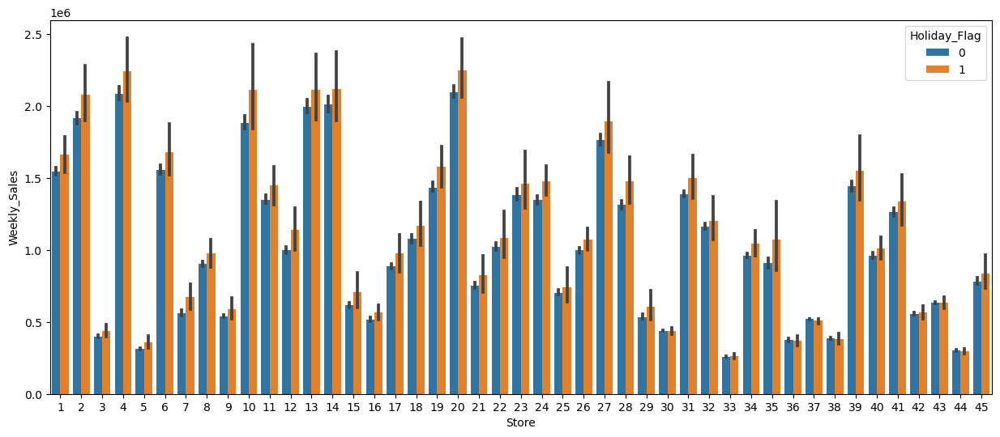

In [23]:
#AVERAGE SALES OF STORES , WITH RESPECT TO  HOLIDAY OR NOT.

plt.figure(figsize=(15,6))
sns.barplot(x='Store', y='Weekly_Sales', hue='Holiday_Flag', data=data)
plt.show()

### EFFECT OF TEMPERATURE ON  WEEKLY SALES.

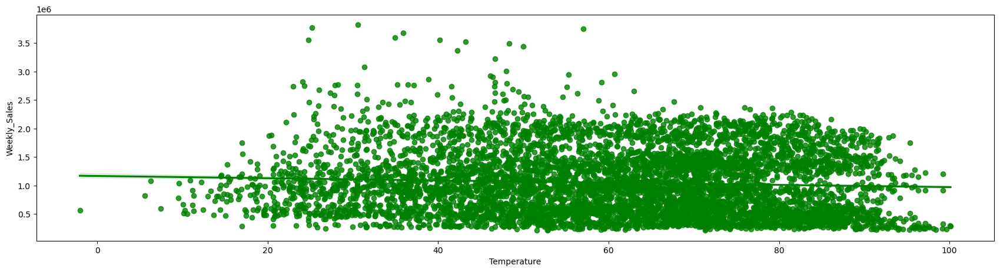

In [24]:
sns.regplot(x='Temperature',y='Weekly_Sales', data=data,color='green')
plt.show()

In [25]:
# VISUALIZING THE EFFECT OF TEMPERATURE ON SALES  AFTER DIVIDING TEMPERATURE ON A GROUP PF 20-20 AND  CHECKING THE FOOTFALL FOR EACH CATEGORY.
def temp(input):
    if(input>=0 and input<=21):
     return('other')
    elif(input>=20 and input<=41):
      return('20-40')
    elif(input>=40 and input<=61):
      return('40-60')
    elif(input>=60 and input<=81):
      return('60-80')
    elif(input>=80 and input<=101):
      return('80-100')
    else:
      return('other')

In [26]:
df1= data.copy()

In [27]:
df1['Temp_dist.']=data['Temperature'].apply(temp)

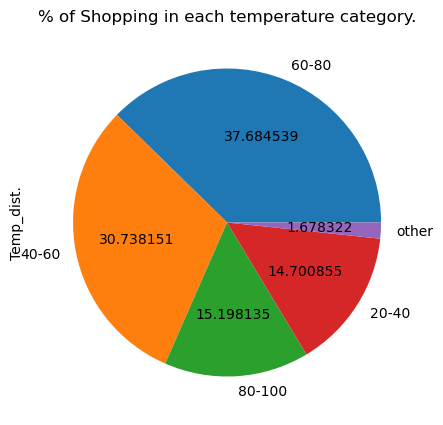

In [28]:

df1['Temp_dist.'].value_counts().plot(kind='pie',autopct='%2f')
plt.title("% of Shopping in each temperature category.")
plt.show()

In [ ]:
#Most of the shopping was done when temperature was between 60-80.

### EFFECT OF FUEL PRICES ON WEEKLY SALES.

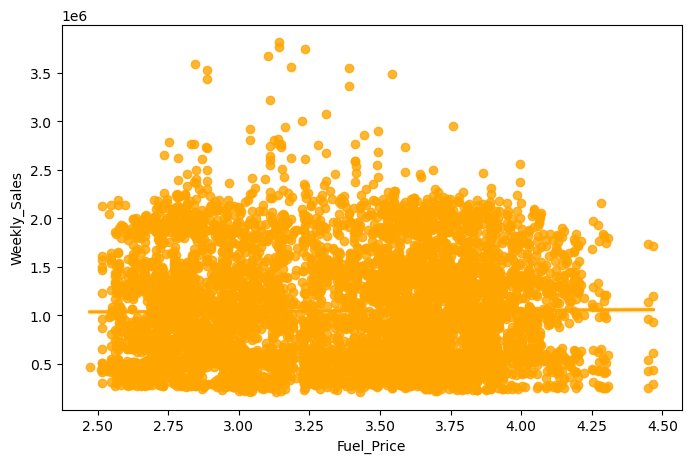

In [29]:


plt.figure(figsize=(8,5))
sns.regplot(x='Fuel_Price',y='Weekly_Sales', data=data,color='orange')
plt.show()

In [30]:
#there is no such impace of fuel_prices on weekly_sales ,  on contrary there is very slight increase in weekly sales with
#increase in fuel prices.

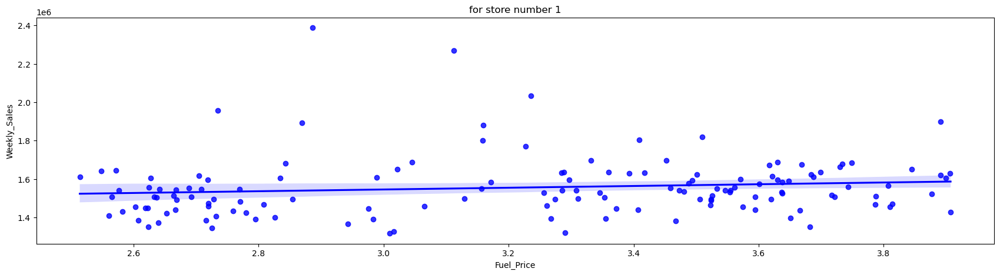

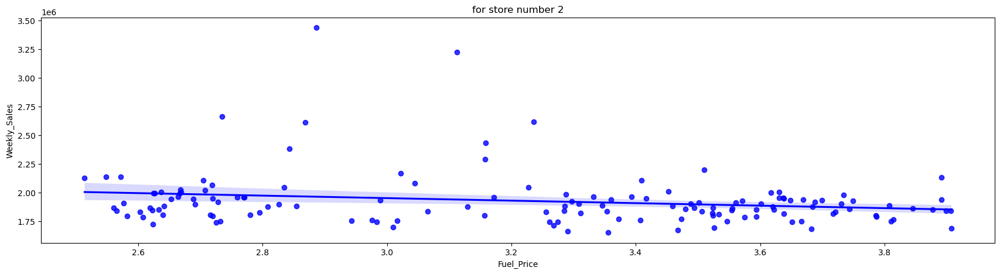

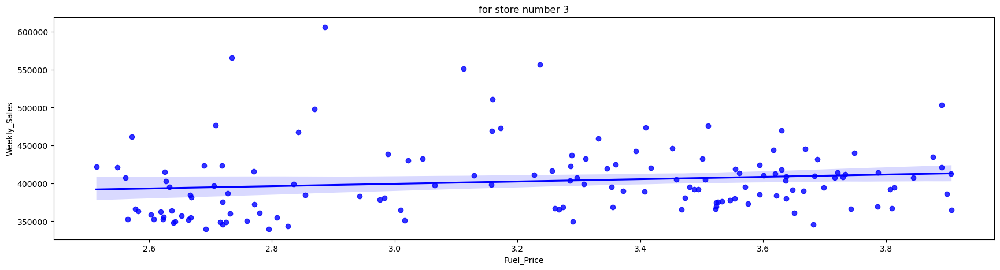

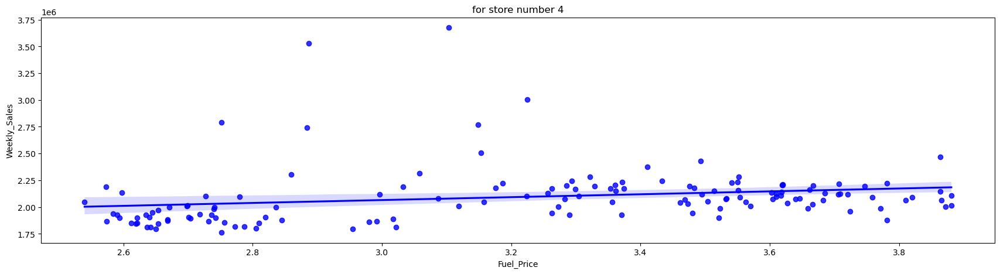

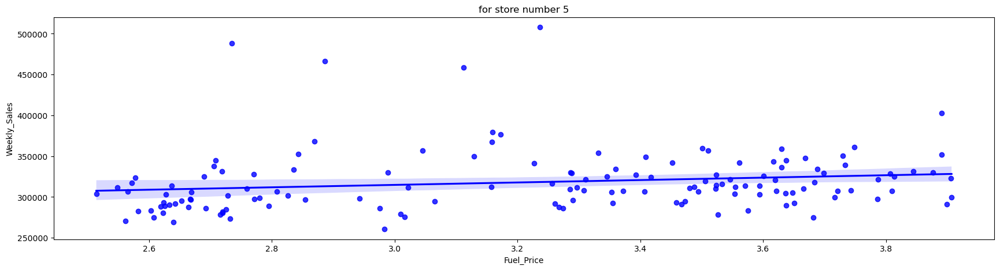

...

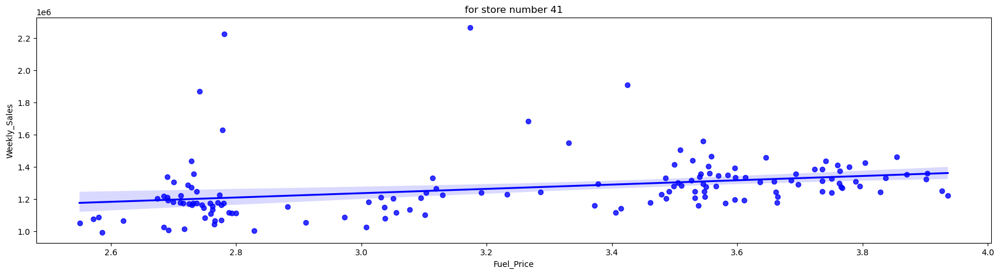

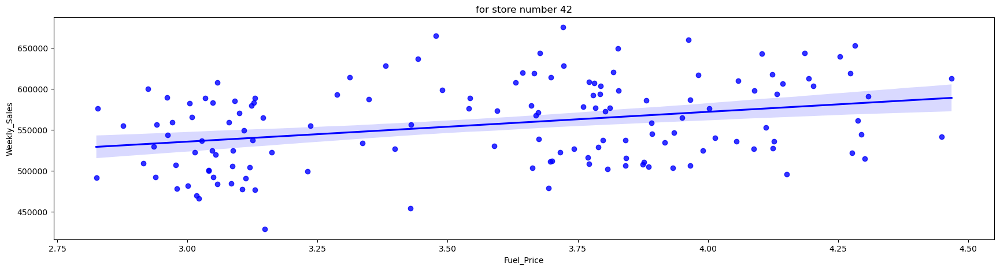

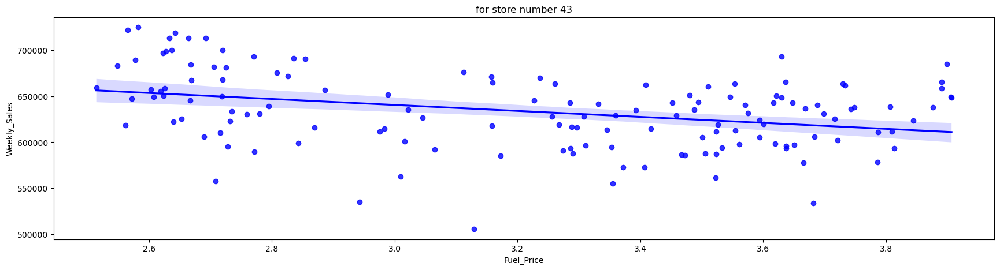

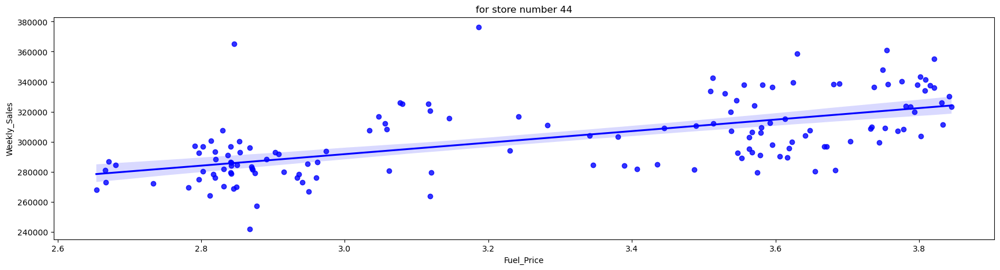

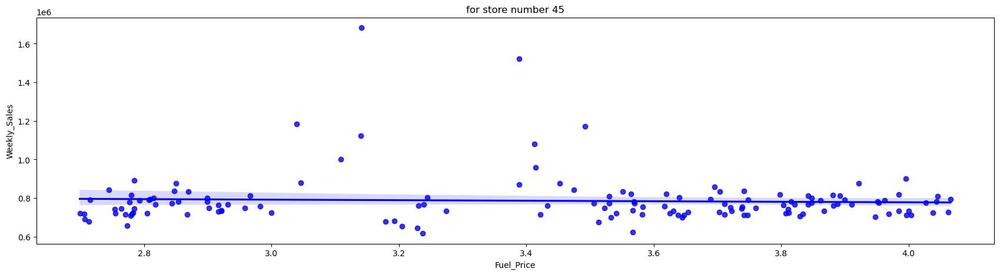

In [31]:
#Effect of FuelPrice for each  store
for i in range(1,46):
  df=data[data['Store']==i]
  sns.regplot(x='Fuel_Price',y='Weekly_Sales',data=df,color='b')
  plt.title(f'for store number {i}')
  plt.show()

### EFFECT OF CPI ON WEEKLY SALES.

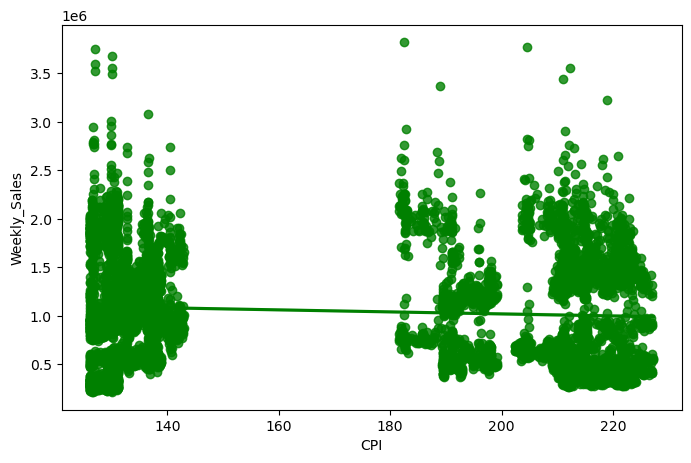

In [32]:
plt.figure(figsize=(8,5))
sns.regplot(x='CPI',y= 'Weekly_Sales', data=data,color='green')
plt.show()

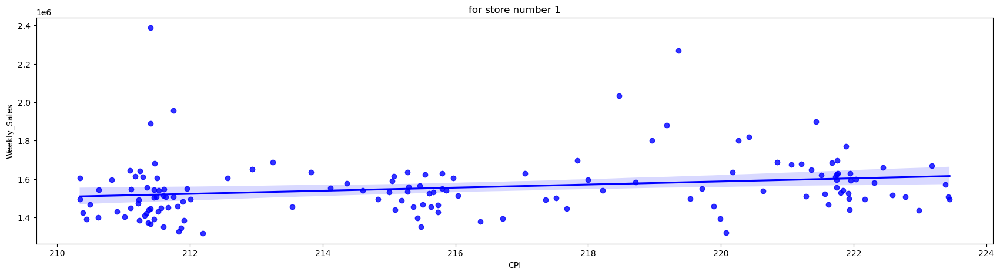

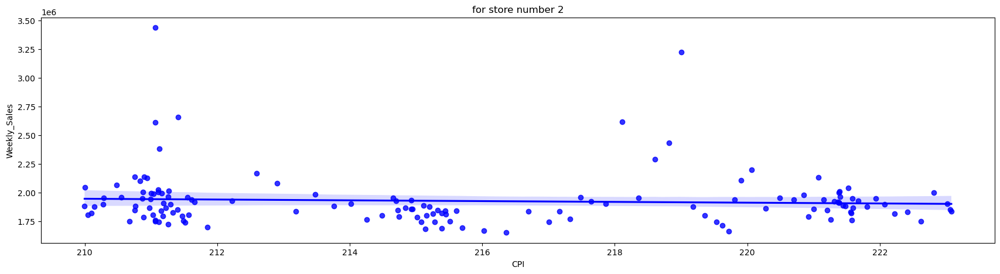

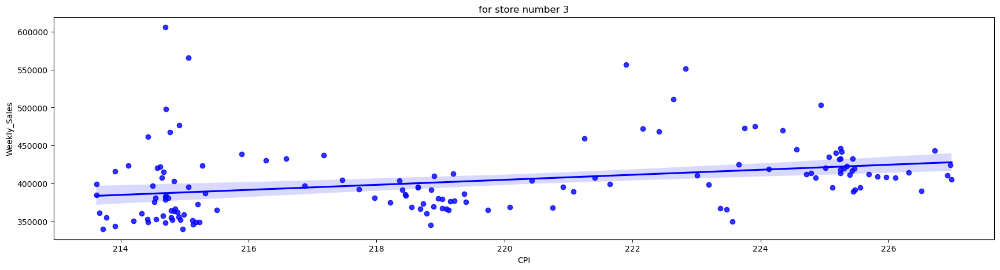

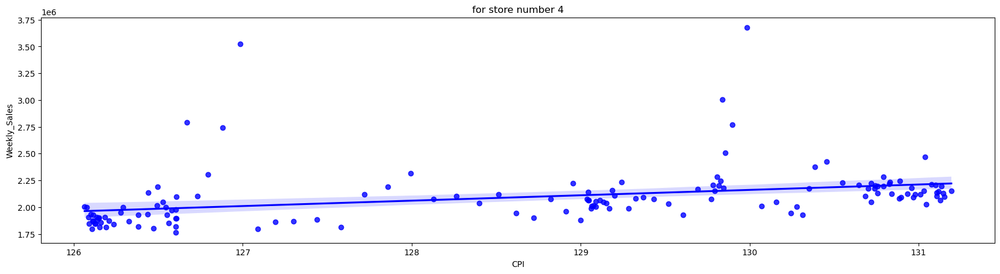

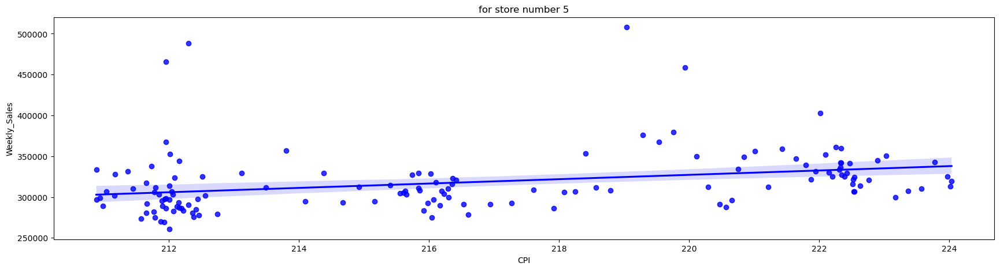

...

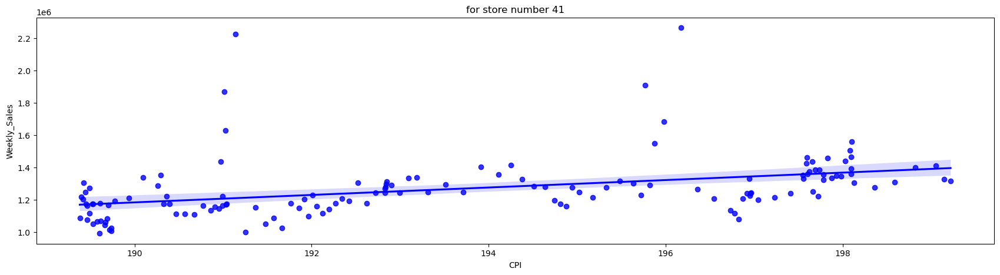

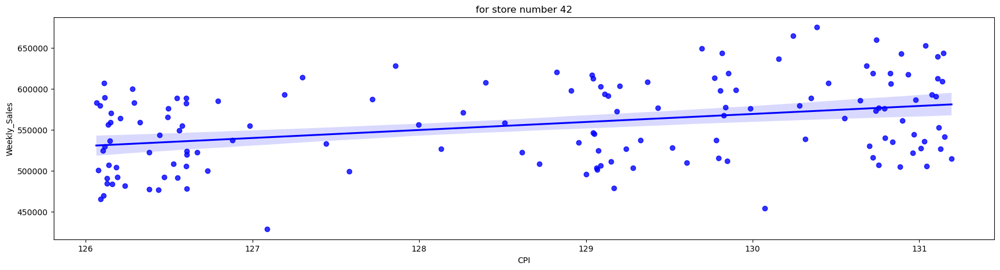

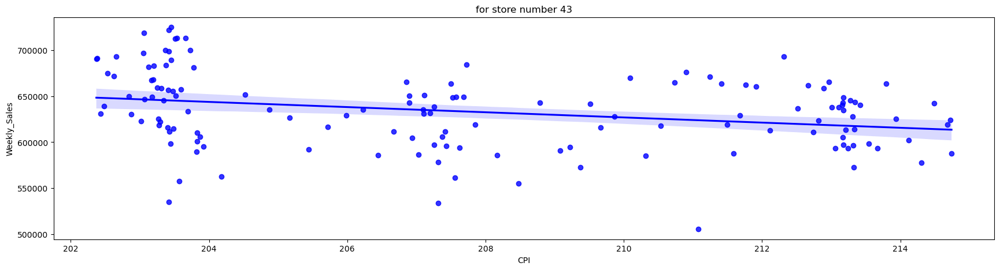

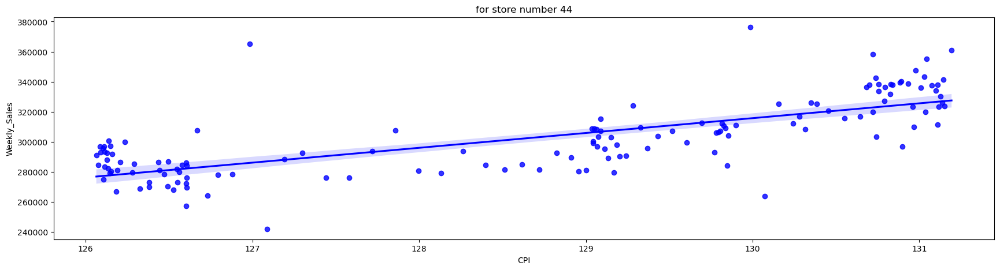

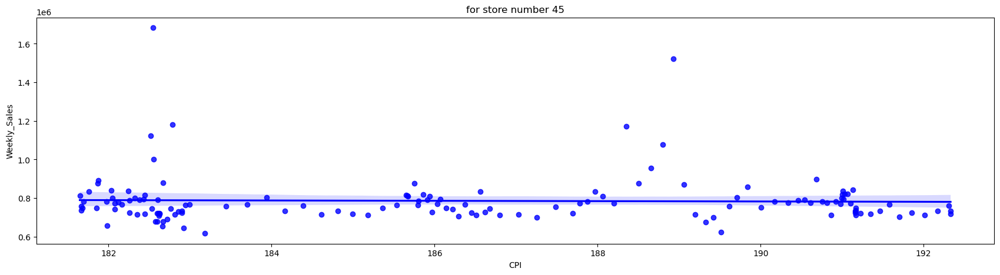

In [33]:
#Effect of CPI on various stores.
for i in range(1,46):
  df=data[data['Store']==i]
  sns.regplot(x='CPI',y='Weekly_Sales',data=df,color='b')
  plt.title(f'for store number {i}')
  plt.show()

### EFFECT OF UNEMPLOYMENT ON WEEKLY SALES.

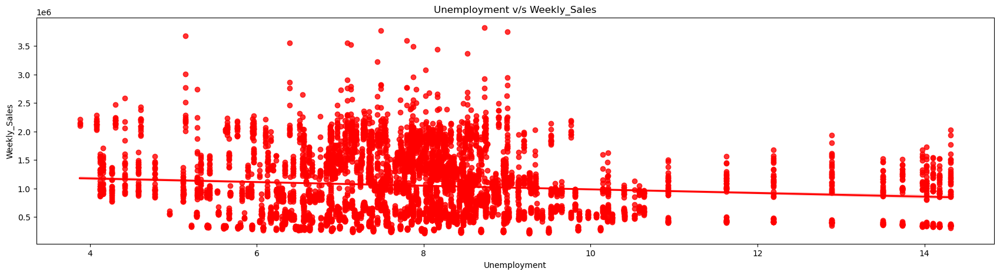

In [34]:

sns.regplot(x='Unemployment', y='Weekly_Sales', data=data,color='red')
plt.title('Unemployment v/s Weekly_Sales')
plt.show()

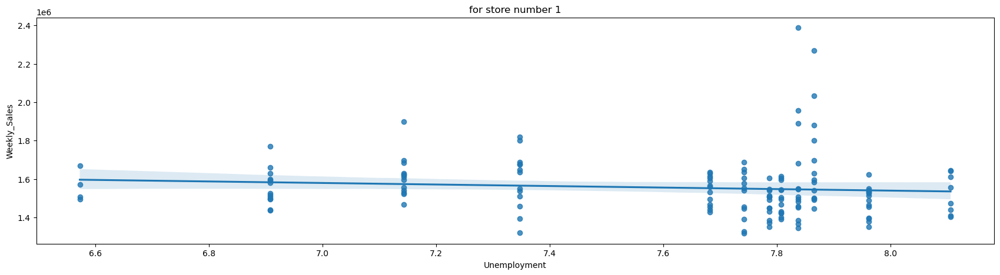

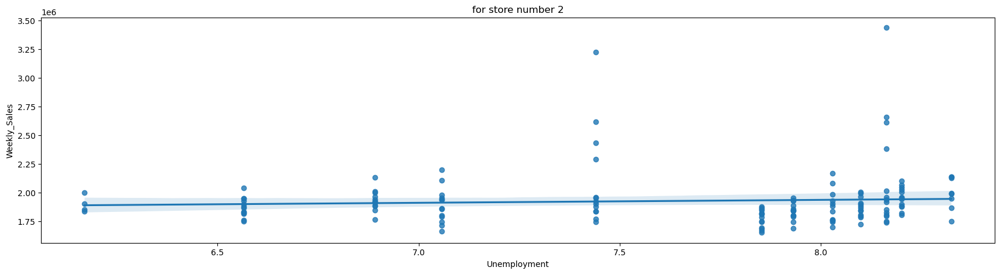

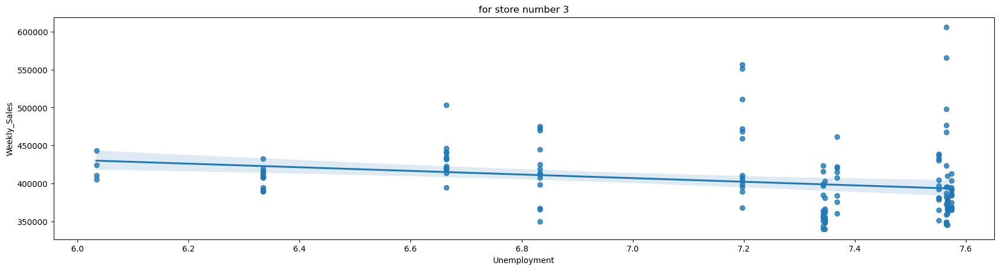

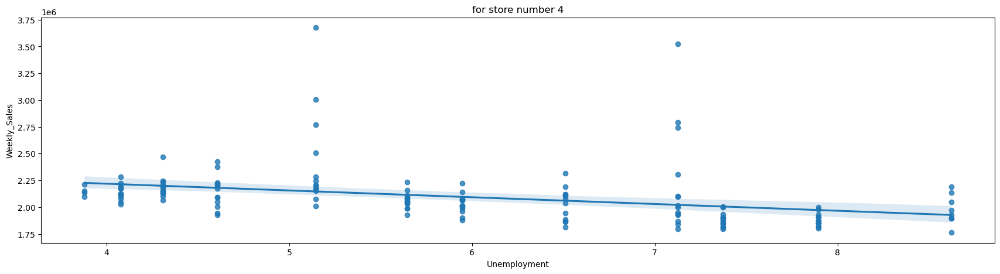

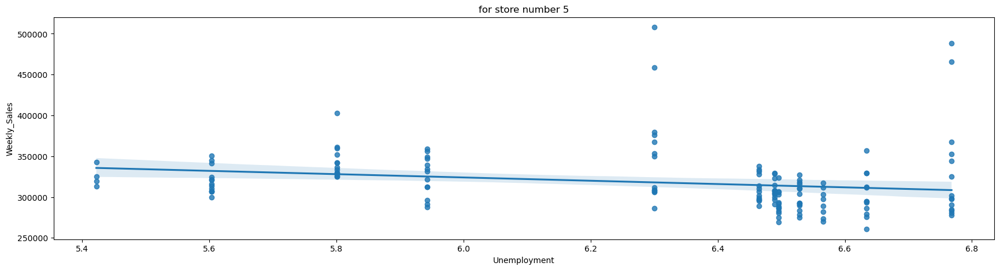

...

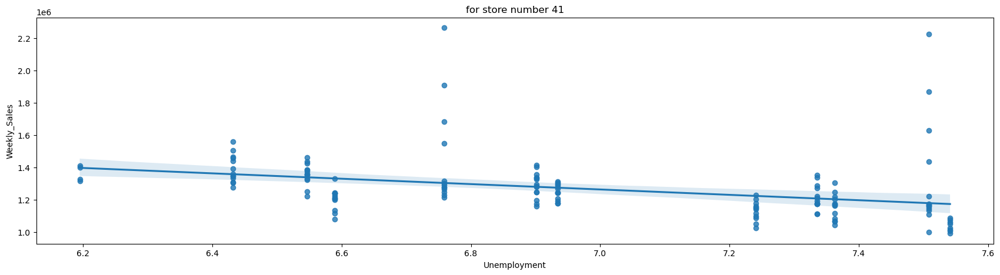

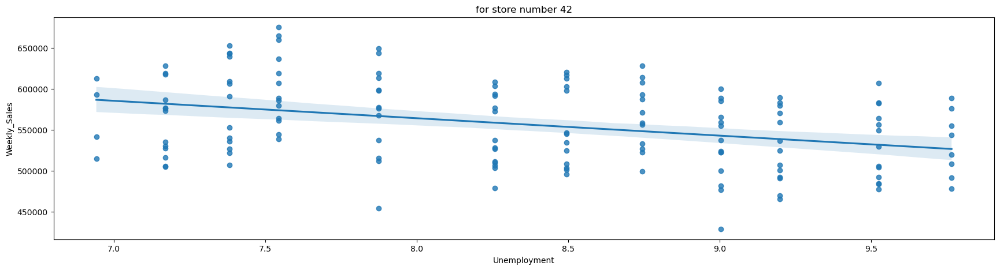

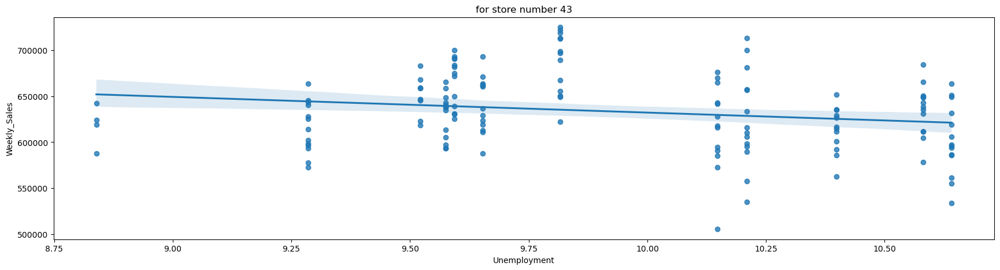

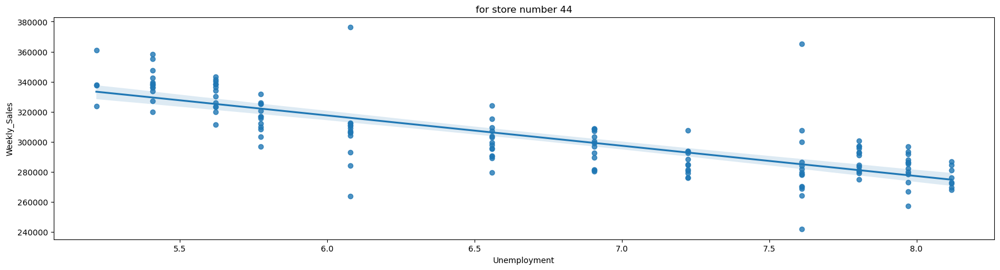

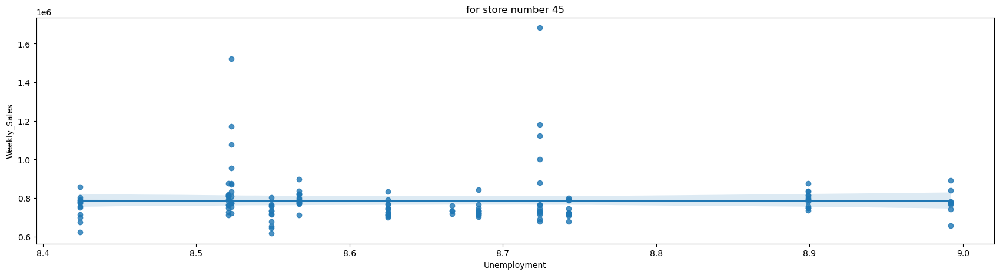

In [35]:
#Effect of unemploynment for each  store

for i in range(1,46):
  df=data[data['Store']==i]
  sns.regplot(x='Unemployment',y='Weekly_Sales',data=df)
  plt.title(f'for store number {i}')
  plt.show()

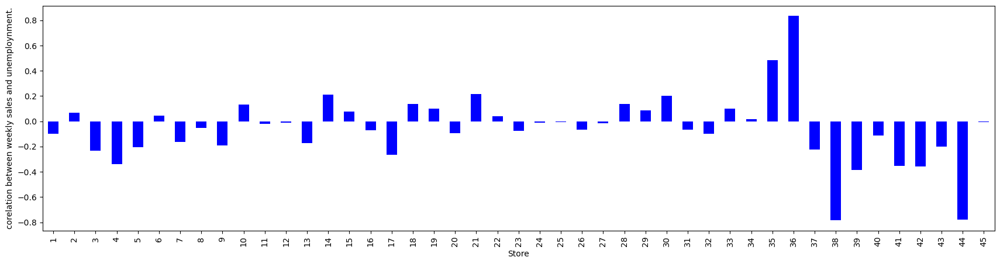

In [36]:
#WORST EFFCTED STORE BY UNEMPLOYNMENT RATIO.

grouped= data.groupby('Store')
grouped.apply(lambda group: group['Unemployment'].corr(group['Weekly_Sales'])).plot(kind='bar', color='b')
plt.ylabel('corelation between weekly sales and unemploynment.')
plt.show()

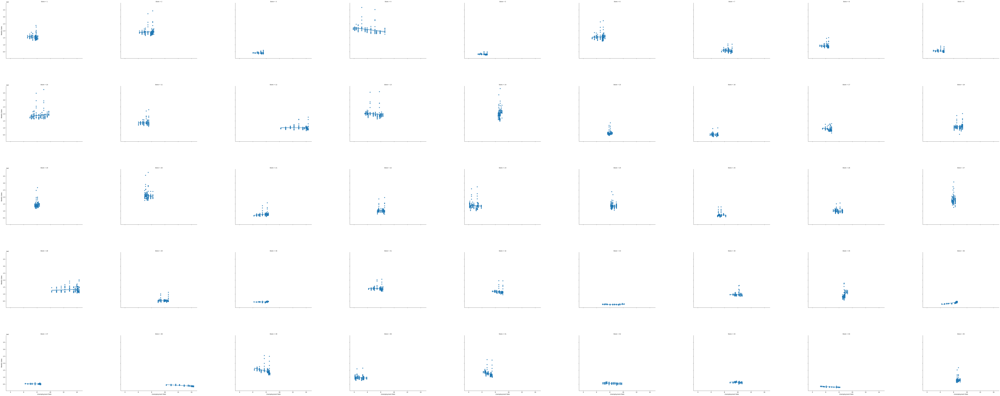

In [37]:
#Effect of unemploynment on sales at a glance

g= sns.FacetGrid(data, col='Store', col_wrap=9, height=8, aspect=1.4)
g.map(sns.regplot,"Unemployment", "Weekly_Sales")
g.set_axis_labels("Unemployment Rate", "Weekly Sales")
g.fig.subplots_adjust(wspace=0.5, hspace=0.5)
plt.show()


### BETTER SALES ON HOLIDAYS OR WORKING DAYS

In [38]:
df1=pd.DataFrame(data['Holiday_Flag'].value_counts())
df1['Sales']=data.groupby('Holiday_Flag')['Weekly_Sales'].sum()
df1

,Holiday_Flag,Sales
0,5985,6.231919e+09
1,450,5.052996e+08


In [39]:
a=pd.DataFrame(df1['Sales']/df1['Holiday_Flag'], columns=['Average_sales'])
a=pd.DataFrame(a['Average_sales'].astype(int))
a

,Average_sales
0,1041256
1,1122887


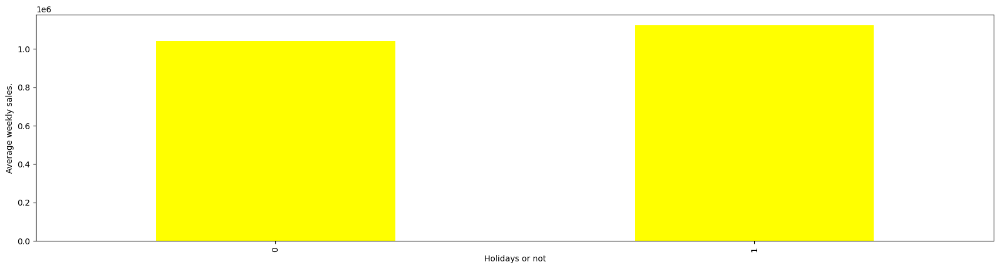

In [41]:
a['Average_sales'].plot(kind='bar',color='yellow')
plt.xlabel('Holidays or not')
plt.ylabel('Average weekly sales.')
plt.show()

In [ ]:
((1122888.0-1041256.30)/1041256.30)*100

7.8397316779739965

# SEASONAL DECOMPOSITION OF THE DATA.

### SEASONAL DECOMPOSE  FOR ENTIRE DATASET.

In [ ]:
import plotly.express as px



Seasonal Decomposition for Overall sales per week.


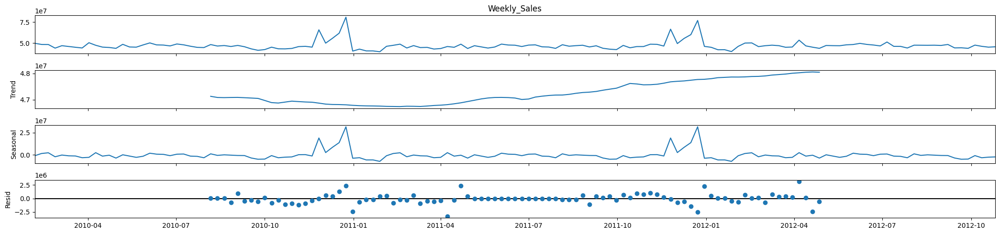

In [ ]:
df1= data[['Date','Weekly_Sales']]
df1=pd.DataFrame(df1.groupby('Date')['Weekly_Sales'].sum().reset_index())
df2=df1.copy()
df2.columns=['ds','y']
df2['ds']=pd.to_datetime(df2['ds'],dayfirst=True)
df2= df2.sort_values(by='ds')
fig=px.line(df2, x="ds", y="y", title="Curve for Sum of Overall sales Per week.")
fig.show()

print('')
print('')
print("Seasonal Decomposition for Overall sales per week.")
df1['Date']=pd.to_datetime(df1['Date'],dayfirst=True)
df1= df1.sort_values(by='Date')
df1= df1.set_index(['Date'])
from statsmodels.tsa.seasonal import seasonal_decompose
decompose_result = seasonal_decompose(df1['Weekly_Sales'].dropna())
decompose_result.plot();
plt.show()

# PREDICTION FOR NEXT 12 WEEKS FOR STORE NUMBER 1.

In [42]:
! pip install prophet
from prophet import Prophet

     ---------------------------------------- 13.3/13.3 MB 9.3 MB/s eta 0:00:00
     -------------------------------------- 93.0/93.0 kB 294.6 kB/s eta 0:00:00
     -------------------------------------- 913.1/913.1 kB 8.2 MB/s eta 0:00:00


In [43]:
df1= data[data['Store']==1][["Date",'Weekly_Sales']]

#Renaming the columns.
df1.columns=['ds','y']

#Changing the datatype of ds column to datetime.
df1['ds']= pd.to_datetime(df1['ds'],dayfirst=True)

In [44]:
m = Prophet(
    seasonality_prior_scale=50,
    holidays_prior_scale=10.0,
    changepoint_prior_scale=0.10,
    yearly_seasonality=25,
    growth='linear',
    interval_width=0.95,
    )
m.add_country_holidays(country_name='US')
m.fit(df1)

02:01:35 - cmdstanpy - INFO - Chain [1] start processing
02:01:35 - cmdstanpy - INFO - Chain [1] done processing


In [45]:
future=m.make_future_dataframe(periods=12,freq='W')

In [46]:
forecast= m.predict(future)

In [47]:
f1=forecast[['ds','yhat_lower','yhat_upper','yhat']]

In [48]:
#Forecasted Values for 12 weeks.

forecasted_values= f1.tail(12)[['ds','yhat']]
forecasted_values['yhat']=forecasted_values['yhat'].astype(int)
forecasted_values

,ds,yhat
143,2012-10-28,1461410
144,2012-11-04,1734514
145,2012-11-11,1586279
146,2012-11-18,1633416
147,2012-11-25,2015953
148,2012-12-02,1672216
149,2012-12-09,1771312
150,2012-12-16,1993993
151,2012-12-23,2196432
152,2012-12-30,1529676


In [49]:
#representation of the values using graph.

from prophet.plot import plot_plotly, plot_components_plotly
plot_plotly(m, forecast)

### MODEL EVALUATION AND TECHNIQUES.

In [50]:
#predicted value.
predicted=f1.iloc[0:143]['yhat']

#Actual value.
actual= df1['y']

#Scoring.
from sklearn.metrics import r2_score , mean_absolute_error

#R2_score of the model.
print('R2_score of model is',r2_score(actual, predicted))

#Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs(np.array(actual) - np.array(predicted)) / np.array(actual)) * 100
print(f'Mean Absolute Percentage Error (MAPE) {mape}')

#Mean absolute Error.
print(f'Mean Absolute error is {mean_absolute_error(actual, predicted)}')

R2_score of model is 0.9321210875144355
Mean Absolute Percentage Error (MAPE) 2.0286286695033704
Mean Absolute error is 31582.679756172867


# CREATING A FUNCTION FOR PREDICTING  SALES FOR ANY STORE.

In [54]:
def predict_sales():
  a= int(input("Enter the sotre number[1,45] for which you want to predict the sales."))
  df1= data[data['Store']==a][["Date",'Weekly_Sales']]

  #Renaming the columns.
  df1.columns=['ds','y']

  #Changing the datatype of ds column to datetime.
  df1['ds']= pd.to_datetime(df1['ds'],dayfirst=True)

  #Calling model
  m = Prophet(
     seasonality_prior_scale=50,
     holidays_prior_scale=10.0,
     changepoint_prior_scale=0.10,
     yearly_seasonality=25,
     growth='linear',
     interval_width=0.95 )

  m.add_country_holidays(country_name='US')
  m.fit(df1)

  #Creating future dataframe
  future=m.make_future_dataframe(periods=12,freq='W')

  #Predicting.
  forecast= m.predict(future)
  f1=forecast[['ds','yhat_lower','yhat_upper','yhat']]

  print('')
  print('')
  print('')
  print('Predicted Values')
  #Forecasted Values for 12 weeks.

  forecasted_values= f1.tail(12)[['ds','yhat']]
  forecasted_values['yhat']=forecasted_values['yhat'].astype(int)
  print(forecasted_values)


  #predicted value.
  predicted=f1.iloc[0:143]['yhat']

  #Actual value.
  actual= df1['y']

  print('')
  print('')
  print('')
  print('Performance of the models')
  #Scoring.
  from sklearn.metrics import r2_score , mean_absolute_error

  #R2_score of the model.
  print('R2_score of model is',r2_score(actual, predicted))

  #Mean Absolute Percentage Error (MAPE)
  mape = np.mean(np.abs(np.array(actual) - np.array(predicted)) / np.array(actual)) * 100
  print(f'Mean Absolute Percentage Error (MAPE) {mape}')

  #Mean absolute Error.
  print(f'Mean Absolute error is {mean_absolute_error(actual, predicted)}')


In [55]:
predict_sales()

Enter the sotre number[1,45] for which you want to predict the sales.2


02:06:16 - cmdstanpy - INFO - Chain [1] start processing
02:06:16 - cmdstanpy - INFO - Chain [1] done processing





Predicted Values
            ds     yhat
143 2012-10-28  1802647
144 2012-11-04  2089617
145 2012-11-11  1957277
146 2012-11-18  2088710
147 2012-11-25  2657305
148 2012-12-02  2130052
149 2012-12-09  2370005
150 2012-12-16  2687328
151 2012-12-23  3172718
152 2012-12-30  1945680
153 2013-01-06  1841260
154 2013-01-13  1879070



Performance of the models
R2_score of model is 0.948254801743448
Mean Absolute Percentage Error (MAPE) 2.219125468890605
Mean Absolute error is 42773.10070498349
